In [2]:
print('in this project were gonna develope an ml alghoritm to pridict T.Time')

in this project were gonna develope an ml alghoritm to pridict T.Time


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [4]:

# Read the CSV file into a DataFrame for data analysis
df=pd.read_csv("../data/synthetic_cement_thickening_dataset_10000.csv")

In [5]:
#Display the first 5 rows of the dataframe to get a quick overview of the data
df.head()

,Pressure_psi,Depth_ft,Temperature_F,Retarder_pct,Density_ppg,ThickeningTime_hr
0,6094.11,13555.57,193.97,1.082,13.10,10.26
1,2322.93,10281.49,262.78,0.292,16.46,8.50
2,3322.16,11119.74,158.30,1.923,13.48,12.27
3,3106.23,13095.02,230.34,2.284,16.88,12.08
4,3055.44,14996.81,232.07,0.525,13.62,9.41


In [6]:
# Display summary of the dataframe including number of non-null entries
# column data, types and memory usage
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Pressure_psi       10000 non-null  float64
 1   Depth_ft           10000 non-null  float64
 2   Temperature_F      10000 non-null  float64
 3   Retarder_pct       10000 non-null  float64
 4   Density_ppg        10000 non-null  float64
 5   ThickeningTime_hr  10000 non-null  float64
dtypes: float64(6)
memory usage: 468.9 KB


In [7]:
# Generate descriptive statistics of the DataFrames numirical columns
#, including count,mean,std,min,max and quartiles
df.describe()

,Pressure_psi,Depth_ft,Temperature_F,Retarder_pct,Density_ppg,ThickeningTime_hr
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,4966.445346,10006.435837,224.750545,1.300895,14.998352,10.068742
std,1712.512767,2887.340374,43.282083,0.694271,1.732928,1.596940
min,2000.130000,5000.160000,150.020000,0.100000,12.000000,5.390000
25%,3499.477500,7481.387500,187.107500,0.698000,13.510000,8.897500
50%,4966.080000,10010.405000,224.710000,1.301500,14.990000,10.075000
75%,6412.347500,12515.902500,262.670000,1.904250,16.500000,11.270000
max,7999.250000,14999.490000,299.990000,2.500000,18.000000,14.550000


In [8]:
# check for missing values in each column of the dataframe and 
# sum them up to see the total number of nulls per column
df.isnull().sum()

Pressure_psi         0
Depth_ft             0
Temperature_F        0
Retarder_pct         0
Density_ppg          0
ThickeningTime_hr    0
dtype: int64

In [9]:
# computes the pairwise corroletion of nemerical columns in the DataFRame
# it helps identify how strongly variables are rellated to each other
# with values ranging from -1 to +1
# this method is often used in data analysis to detect linear relationships
# between features
df.corr()

,Pressure_psi,Depth_ft,Temperature_F,Retarder_pct,Density_ppg,ThickeningTime_hr
Pressure_psi,1.000000,-0.002474,0.005215,0.003562,-0.015457,0.013313
Depth_ft,-0.002474,1.000000,-0.006008,0.004929,-0.006226,0.005698
Temperature_F,0.005215,-0.006008,1.000000,-0.005319,0.001338,-0.409395
Retarder_pct,0.003562,0.004929,-0.005319,1.000000,-0.016118,0.794094
Density_ppg,-0.015457,-0.006226,0.001338,-0.016118,1.000000,-0.341730
ThickeningTime_hr,0.013313,0.005698,-0.409395,0.794094,-0.341730,1.000000


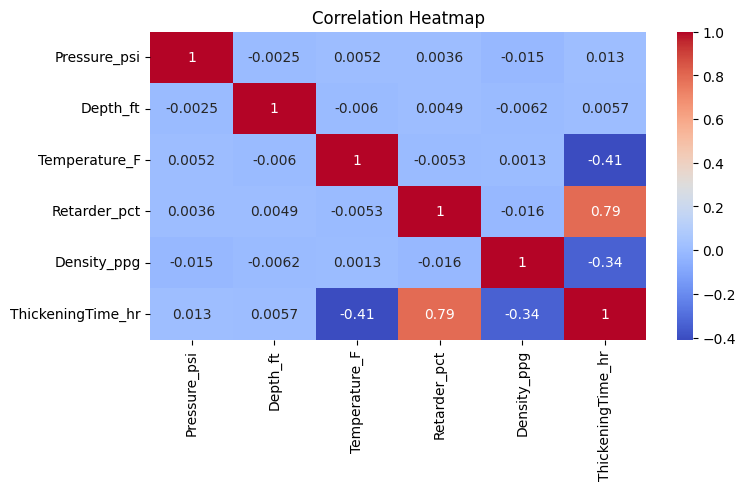

In [10]:
# plot a heatmap to visualize the correlation matrix of numerical
# features in the dataframe
# this helps to identify relationships and dependencies between variables
plt.figure(figsize=(8,4))
sns.heatmap(df.corr(),annot=True,cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

In [11]:
# calculation the correlation of all features with the target variable
# "Thickening Time"
# then sort the correlation values in ascending order to see 
# which features have the strongest negative or positive correlation
# with Thickening Time
df.corr()['ThickeningTime_hr'].sort_values(ascending=False)

ThickeningTime_hr    1.000000
Retarder_pct         0.794094
Pressure_psi         0.013313
Depth_ft             0.005698
Density_ppg         -0.341730
Temperature_F       -0.409395
Name: ThickeningTime_hr, dtype: float64

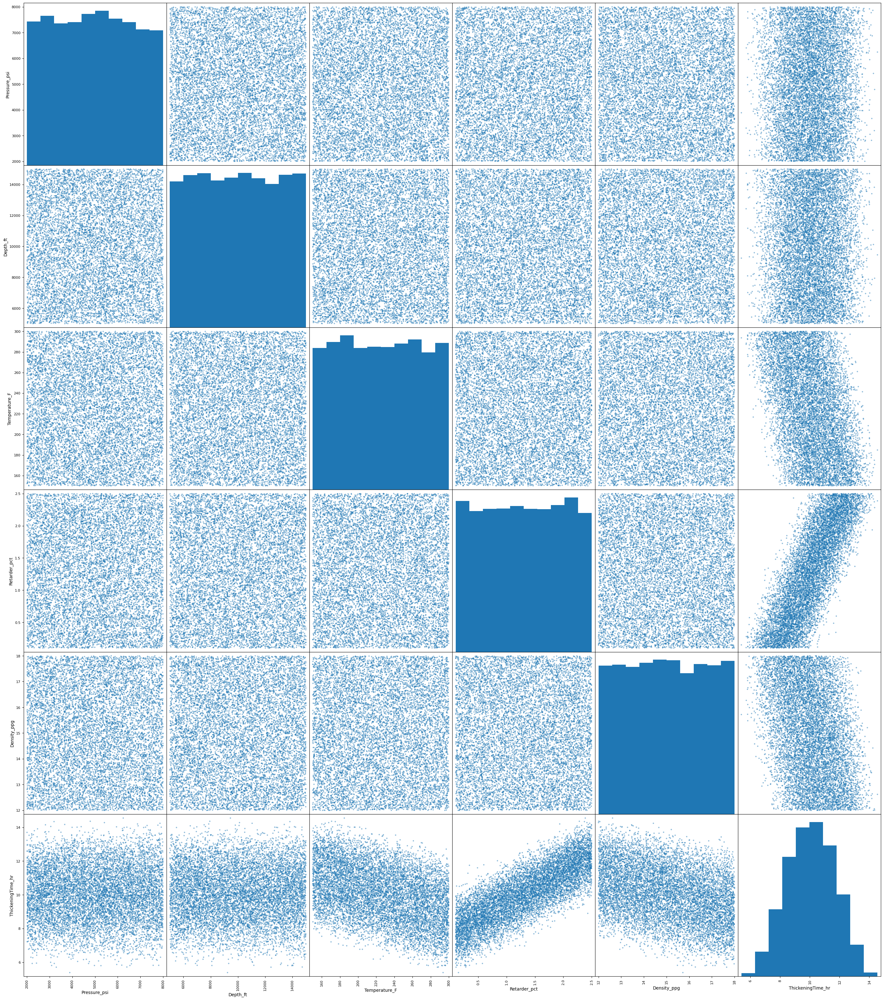

In [12]:
#### scatter matrix
# A scatter matrix is a grid of scatter plots that shows pairwise 
# relationships between multiply numerical variables in a dataset.

# why use a scatter plot? 
# quickly explore relationships between several variables at once.
# to detect patterns or potential linear and non-linear relationships.
# to find groups or clusters within data

from pandas.plotting import scatter_matrix
scatter_matrix(df,figsize=(35,40))
plt.show()